After all the work on the planet GAN, let's see if I can take what I've learned there and apply it to make a GAN that makes images of myself. In theory anyway, I can consent to my own experiments, so the issues with consent shoudn't be a problem here. 

Given the earlier problems, I think I will need well over 100k, more like 200-300k distinct images of myself to make the WGAN provided by FastAI work properly. I got that many images of myself by decomposing videos of myself into their component frames. 5 of the 6 videos were made in my office from my webcam. the 6th is the cropped video from my 2019 PyCon talk. If I combine all of those, I end up with over 280k images, so I'm optimistic that will be enough total images.

I'm a little concerned about the office videos, since the background will be constant across all of those, so if I use only those videos I'm concerned that the GAN will learn only how to make my whiteboard and bookcase, but not me. I should test that, though. In any case, one of the ways I tried to fight that was by moving the mount point of the camera a few times, so that it looked at me from different parts of the office. That was, I think, only partly successful (the whiteboard is still prominent in the background of a few of them, just differently so), so I admit to some concern about the value of the office videos.

Also, before I start, I need to make sure I re-size each of the images to max 400x400 thumbnails just to make sure the GPU can get data fast enough.

I think the order of experiments is:

 1. Try with just one of the office videos, which should look *terrible*. 
 2. Try with two of the office videos, which should look better, but not great.
 3. Try with just the pycon video, which should still look terrible because it's not enough data (and probably be very blue).
 4. Mix one office with one pycon set of images. 
 5. Try two office with pycon 
 6. EVERYTHING!
 
My *hope* is that by the time it gets to everything, it'll be working at least approximately. We'll see.

In [1]:
from fastai.vision.all import *
from fastai.vision.gan import *

Experiment #1: just one of the office videos. We expect this to look *bad*, partly because the images will have a very static background, and partly because there simply aren't enough of them. The `0` directory of images ha about 38k images. That should be better than the 4k example, but the Earth images were having trouble even when it had 85k images, so I expect this will simply run out of source data.

In [2]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/0")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [3]:
learn.fit(20)

/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (generator) that exists in the learner. Use `self.learn.generator` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (critic) that exists in the learner. Use `self.learn.critic` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (gen_mode) that exists in the learner. Use `self.learn.gen_mode` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")


epoch,train_loss,gen_loss,crit_loss,time
0,-0.412967,0.229045,-0.474676,02:23
1,-0.471163,0.290427,-0.614738,00:48
2,-0.431499,0.292531,-0.612536,00:43
3,-0.410726,0.262164,-0.529548,00:42
4,-0.435616,0.356763,-0.640671,00:43
5,-0.438881,0.315496,-0.611260,00:43
6,-0.444954,0.348944,-0.618250,00:42
7,-0.426755,0.320643,-0.586299,00:42
8,-0.400917,0.305304,-0.560728,00:42
9,-0.383023,0.283350,-0.536303,00:43


/home/g-clef/anaconda3/lib/python3.8/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


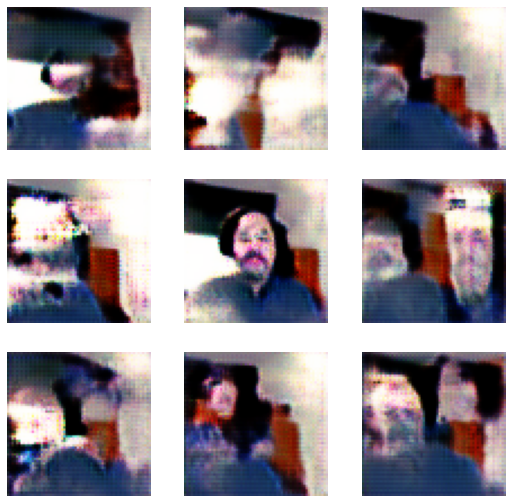

In [4]:
learn.show_results(max_n=9, ds_idx=0)

Heh. I expected failure, and I got it. The middle one is *close* to reasonable, the others are a mix of unidentifiable blobs and nightmare fuel. Yeesh.

Notice, though, that the wall, ceiling, and bookshelf behind me are coming through much better. That's kinda what I expected: the bit that didn't change much between the pictures (the background) is the easier part to learn and simulate, so the GAN can simulate and identify those much more effectively than it did the thing that was changing all over the place: me. 

On to experiment #2: combine the video from two of the personal videos, see if it's better.

So, I made a directory and copied the images from the 0 and 1 videos into that directory.

In [5]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/0+1/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [6]:
learn.fit(20)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.502414,0.199401,-0.524371,04:59
1,-0.556063,0.321350,-0.732817,01:39
2,-0.569499,0.369268,-0.760477,01:27
3,-0.507309,0.345232,-0.697337,01:27
4,-0.459968,0.335742,-0.646577,01:27
5,-0.451704,0.314087,-0.611124,01:28
6,-0.392912,0.308726,-0.566717,01:28
7,-0.403882,0.300607,-0.542098,01:27
8,-0.376925,0.288549,-0.532002,01:27
9,-0.366299,0.296640,-0.524080,01:27


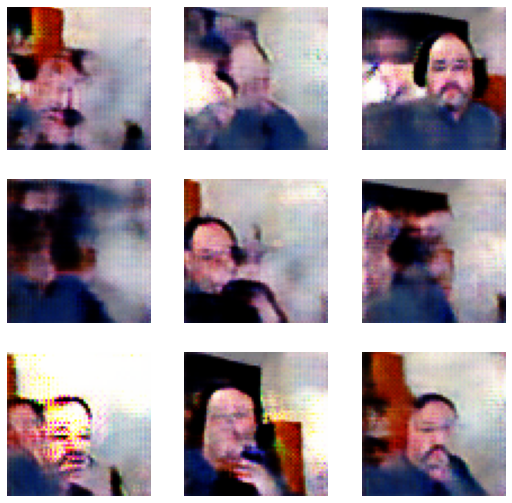

In [7]:
learn.show_results(max_n=9, ds_idx=0)

Somehow this is worse. It's *technically* closer to making good pictures of me, but now it's solidly in the uncanny valley.  I think it's fact that it's getting close to faces, but not actually getting them right that's freaking me out.

The images are definitely better, though. So, pushing forward with more data does seem to be working.

On to experiment #3: use just the PyCon video. This is a much less interesting background, but a lot more variety in my movements.

In [8]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/6/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [9]:
learn.fit(20)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.972919,0.587861,-1.179288,01:48
1,-0.380365,0.255440,-0.493315,01:01
2,-0.397225,0.351994,-0.690102,00:53
3,-0.540419,0.338976,-0.606664,00:53
4,-0.372576,0.333172,-0.600974,00:53
5,-0.324093,0.235682,-0.467939,00:52
6,-0.335853,0.260596,-0.459952,00:52
7,-0.387679,0.371072,-0.510420,00:54
8,-0.374331,0.369334,-0.530881,00:52
9,-0.331751,0.377619,-0.516187,00:52


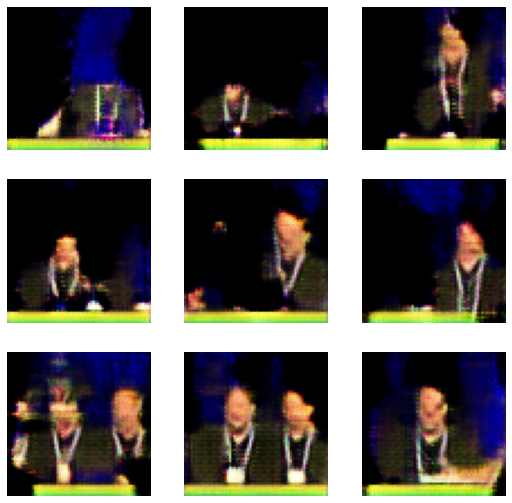

In [10]:
learn.show_results(max_n=9, ds_idx=0)

As with the first one, we expected this to be terrible, and it does not disappoint. It's terrible, but in fascinating new ways. Since I'm moving around so much in the PyCon video, I'm the only detail it can learn, so it's making multiple copies of me. It did also learn the color footer from the images since that was constant across all of them.

On to experiment #4: in this case, we are going to use a combination of the PyCon video with the first office pictures. My hope in this case is that the very different backgrounds will make it more obvious that it should be learning *me* not the background.

In [12]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/0+6/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [13]:
learn.fit(20)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.438310,0.282478,-0.577939,01:31
1,-0.545415,0.340849,-0.672428,01:29
2,-0.501053,0.369606,-0.690193,01:29
3,-0.419475,0.337610,-0.613239,01:30
4,-0.419900,0.332836,-0.568614,01:29
5,-0.359883,0.330543,-0.533117,01:30
6,-0.352132,0.314965,-0.500161,01:29
7,-0.298071,0.274861,-0.439071,01:29
8,-0.287551,0.268806,-0.405506,01:29
9,-0.253489,0.266671,-0.371151,01:29


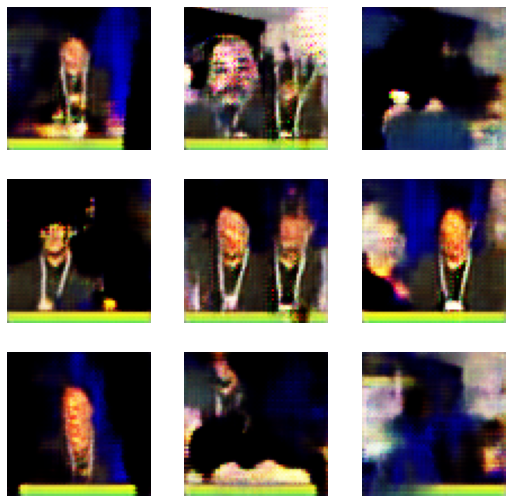

In [14]:
learn.show_results(max_n=9, ds_idx=0)

Like the other example, it's better, but that only puts it deeper into the uncanny valley. It's still doing the duplication from the pycon images, but it's also getting slightly better about overall image, I think. It's interesting to see it start to combine images, like the middle-top one above has the background of my office, but part of the image of me is wearing the conference badge from the pycon video.

So, if this is really that data-hungry, let's try experiment #5 : Combining all 3 datasets used so far at once.

In [15]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/0+1+6/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [16]:
learn.fit(20)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.469769,0.315507,-0.514334,02:31
1,-0.452724,0.346913,-0.646442,02:24
2,-0.426353,0.347213,-0.595572,02:09
3,-0.387702,0.322160,-0.556950,02:09
4,-0.392823,0.343932,-0.543373,02:09
5,-0.323492,0.354558,-0.491528,02:09
6,-0.305521,0.303629,-0.440022,02:09
7,-0.274477,0.293441,-0.399207,02:09
8,-0.253873,0.268557,-0.376588,02:08
9,-0.252778,0.259436,-0.360807,02:09


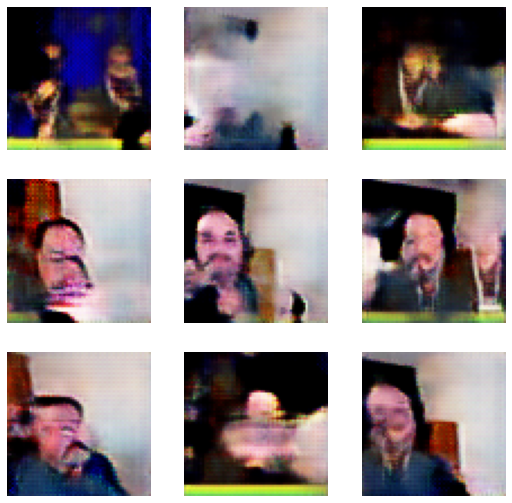

In [17]:
learn.show_results(max_n=9, ds_idx=0)

Still in the uncanny valley, still not right, but you can kinda see it getting closer. It still doesn't do my face consistently, which is a real shame. but it's getting better. 

One obvious change: with more data, it's taking longer to run each epoch. That's not a surprise, it just means that each step takes longer. 

So, now we go on to the last experiment: #6, where we take the 3 videos I've already used, add in two others taken in my office that we haven't used yet (and were taken from other angles), and put them all into one giant ball of training data. Given that the combination will be 300k images in total, I expect this will take a *while* to train.

One note: to avoid duplication, I moved the combo folders out of the base folder for the images. That means if I want to re-create the images above I'll have to pull the images from the new path, but that's something I'll live with.

In [18]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [19]:
learn.fit(20)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.457780,0.361202,-0.579660,29:08
1,-0.456165,0.447407,-0.646661,09:56
2,-0.415400,0.453209,-0.612794,04:36
3,-0.400684,0.431959,-0.594061,04:35
4,-0.394914,0.426812,-0.572515,04:36
5,-0.375693,0.417236,-0.545763,04:36
6,-0.357440,0.400746,-0.520503,04:36
7,-0.336552,0.394833,-0.500394,04:35
8,-0.334735,0.396745,-0.491492,04:35
9,-0.331809,0.388067,-0.476845,04:35


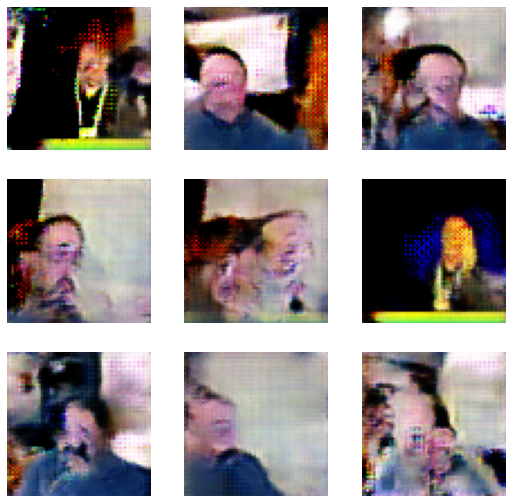

In [20]:
learn.show_results(max_n=9, ds_idx=0)

Well, that's disappointing. 

I thought about it this a bit, and realized two things:
 1. the PyCon video images have a problem: there's a short segment where someone else comes into frame to tell people they can ask questions. It's only 210-ish images in the grand scheme of things, but it's still someone else, so I should remove those.
 2. the PyCon videos may actually be making things worse by confusing it with the very different backgroud pallette. I should try one with just the images made in the office.
 
 So, I'm going to re-do a few runs:
  #7 will be re-doing the PyCon-only one with with images of the other person removed
  #8 will be re-doing the single-office + PyCon one
  #9 will be re-doing the "Everything" one with the fixed PyCon images
  #10 will be trying with just the home office videos, leaving out PyCon

So, let's do #7 - retry with fixed pycon videos.

In [3]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/6/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [4]:
learn.fit(20)

/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (generator) that exists in the learner. Use `self.learn.generator` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (critic) that exists in the learner. Use `self.learn.critic` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (gen_mode) that exists in the learner. Use `self.learn.gen_mode` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")


epoch,train_loss,gen_loss,crit_loss,time
0,-0.670952,0.444383,-0.783885,00:54
1,-0.420767,0.293448,-0.564697,00:51
2,-0.475780,0.386039,-0.590610,00:51
3,-0.465844,0.303750,-0.590842,00:51
4,-0.419899,0.345493,-0.555585,00:51
5,-0.391540,0.320910,-0.537664,00:51
6,-0.390012,0.369984,-0.535009,00:51
7,-0.328482,0.384226,-0.512208,00:51
8,-0.259421,0.305962,-0.390081,00:51
9,-0.128222,0.190319,-0.274018,00:51


/home/g-clef/anaconda3/lib/python3.8/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


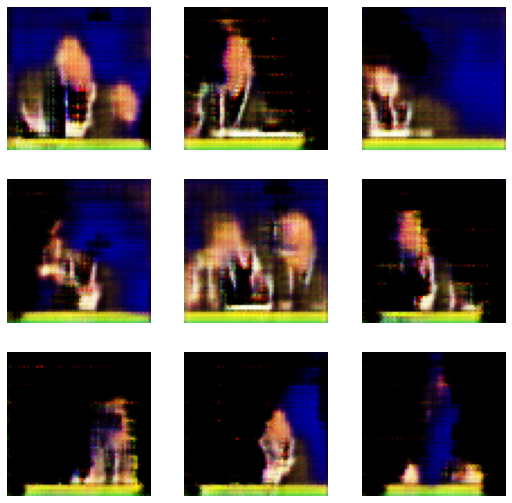

In [5]:
learn.show_results(max_n=9, ds_idx=0)

Not much better than the first time, though I'm interesting that the loss functions got so small compared to the first run. I never got loss that low in any of the other runs of this. Especially interesting that this is all because of 200-ish images out of 58k. It may have over-trained, since loss started going back up near the end. Going to re-try this with fewer epochs to see if I can end the training during the period of super-low loss.

In [9]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/6/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [10]:
learn.fit(15)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.970170,0.665419,-1.252969,00:52
1,-0.664815,0.627975,-1.224652,00:52
2,-0.309807,0.189114,-0.388814,00:52
3,-0.468763,0.354545,-0.554437,00:52
4,-0.440393,0.451676,-0.650267,00:52
5,-0.390725,0.400893,-0.569437,00:52
6,-0.327479,0.426187,-0.502202,00:52
7,-0.350963,0.438270,-0.514385,00:51
8,-0.263060,0.405683,-0.463118,00:51
9,-0.273634,0.393976,-0.410705,00:51


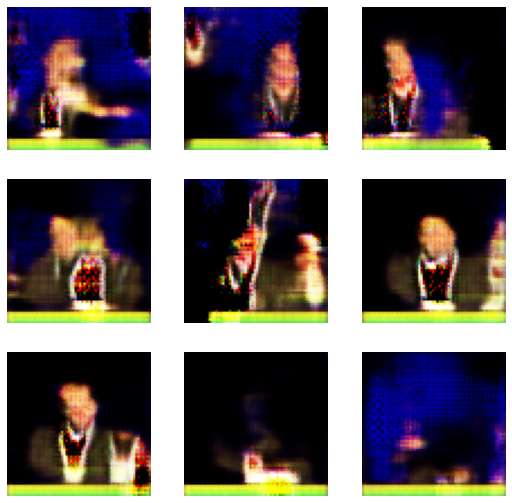

In [11]:
learn.show_results(max_n=9, ds_idx=0)

Nope. Still bad. It was supposed to be bad since this is only 50k images, so this shouldn't be that surprising I guess.

Let's move on to test #8: re-doing the single office set with the fixed PyCon set:

In [12]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism_combos/0+6/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [13]:
learn.fit(20)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.462335,0.332750,-0.714183,03:52
1,-0.521111,0.329806,-0.660580,01:29
2,-0.443609,0.351256,-0.659482,01:29
3,-0.420277,0.344824,-0.596700,01:28
4,-0.368508,0.327306,-0.556868,01:29
5,-0.338349,0.309612,-0.505570,01:28
6,-0.292373,0.289333,-0.441316,01:28
7,-0.278656,0.241886,-0.380947,01:28
8,-0.242303,0.250526,-0.366993,01:28
9,-0.258755,0.210646,-0.353024,01:28


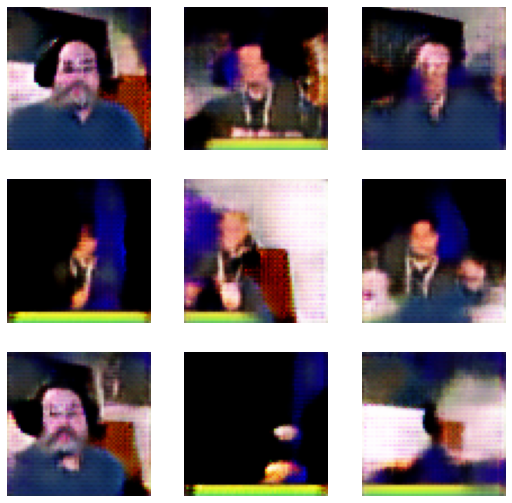

In [14]:
learn.show_results(max_n=9, ds_idx=0)

Interesting. The duplicate problem seems to be gone, but it still doesn't look great. A couple of them are recognizable as being from the first video (when I was standing up and wearing headphones), but it's still blobby and indistinct. The horror-show aspect of the first generation is gone. These don't look scary, just...weird. 

So, let's move on to test #9, which is re-doing the "everything" test with the fixed PyCon videos included.

In [15]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [16]:
learn.fit(20)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.463418,0.285605,-0.554626,24:06
1,-0.445361,0.380361,-0.641224,06:45
2,-0.430601,0.382344,-0.619712,04:34
3,-0.427074,0.390014,-0.600604,04:35
4,-0.409394,0.387412,-0.582848,04:33
5,-0.378534,0.391229,-0.559679,04:32
6,-0.379808,0.358937,-0.543813,04:32
7,-0.362800,0.326677,-0.532807,04:31
8,-0.345676,0.323483,-0.511322,04:30
9,-0.339105,0.315989,-0.494406,04:31


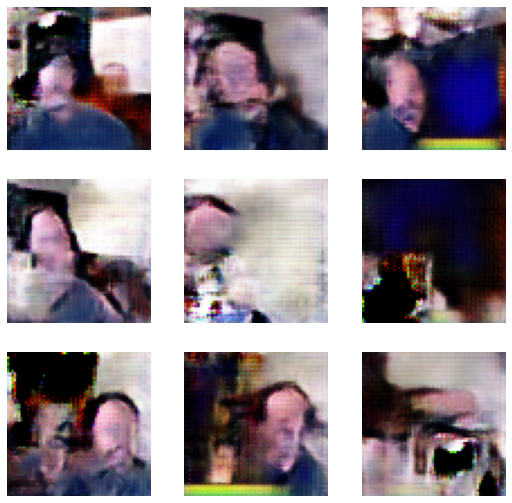

In [17]:
learn.show_results(max_n=9, ds_idx=0)

Hmmm....it's getting the backgrounds fairly well, but the actual faces aren't coming through at all. That's a disappointment.

There's a chance that it could still do better, though. The loss functions were all still trending towards 0, so there's a chance that it can still get better with more training. Let's try training for 10 more epochs.

In [18]:
learn.fit(10)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.261935,0.217833,-0.358870,04:35
1,-0.247327,0.211911,-0.347460,04:34
2,-0.251239,0.206764,-0.339975,04:33
3,-0.236012,0.220035,-0.328886,04:34
4,-0.273969,0.228891,-0.354798,04:33
5,-0.257274,0.207086,-0.365713,04:33
6,-0.290003,0.205353,-0.362696,04:31
7,-0.238834,0.200090,-0.347876,04:33
8,-0.260410,0.210401,-0.350543,04:32
9,-0.254128,0.192138,-0.336527,04:34


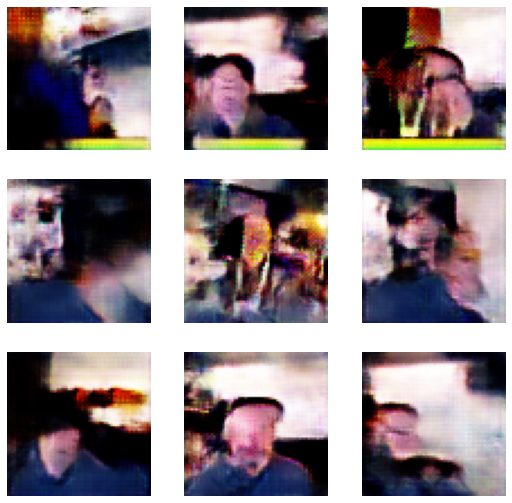

In [19]:
learn.show_results(max_n=9, ds_idx=0)

*slightly* better, but loss seems to have plateau'd. This may be as good as this one gets.

Let's do the last one, which is training on only the office images

In [2]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism_combos/all_office/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [3]:
learn.fit(20)

/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (generator) that exists in the learner. Use `self.learn.generator` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (critic) that exists in the learner. Use `self.learn.critic` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (gen_mode) that exists in the learner. Use `self.learn.gen_mode` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")


epoch,train_loss,gen_loss,crit_loss,time
0,-0.460155,0.318195,-0.532025,25:17
1,-0.431106,0.365737,-0.619162,03:41
2,-0.395543,0.365344,-0.579889,03:40
3,-0.369464,0.358933,-0.546614,03:40
4,-0.366038,0.350563,-0.516159,03:41
5,-0.321961,0.346923,-0.487103,03:40
6,-0.326841,0.337926,-0.463962,03:40
7,-0.303385,0.327588,-0.445329,03:39
8,-0.287523,0.310468,-0.425855,03:40
9,-0.279513,0.304988,-0.411857,03:40


/home/g-clef/anaconda3/lib/python3.8/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


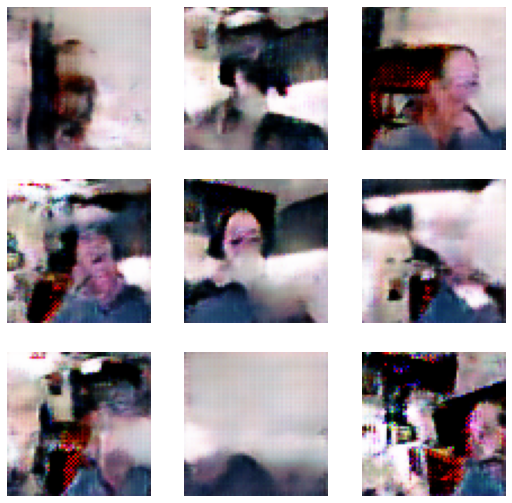

In [4]:
learn.show_results(max_n=9, ds_idx=0)

well, that's somewhat disappointing also. It's just a mess. Losses on this one were also still decreasing, so I'm going to hail-mary this with one more training round, to see if it can clean up a bit. 

Looking at the other results, the single-viewpoint ones were the clearest. The lesson here may be that I'm actually making things worse by combining multiple viewpoints. Since each viewpoint has a bunch of images, the learner may be getting 5 or 6 anchor points still, and then learning a mishmosh of the stuff between them. In the bedrooms dataset, each picture was totally different, with no commonalities between backgrounds. My giving it things with some commonalities between the backgrounds may be confusing the issue by giving it something other than *me* to learn.

On reflection, though, the Earth GAN had a static background and it still had problems with the background bleeding into the main image. 

In [5]:
learn.fit(10)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.218846,0.229380,-0.321682,03:41
1,-0.200271,0.222332,-0.310080,03:40
2,-0.197534,0.206820,-0.292381,03:41
3,-0.194019,0.201501,-0.285843,03:39
4,-0.195070,0.195002,-0.279446,03:40
5,-0.205248,0.174137,-0.284271,03:38
6,-0.214104,0.189057,-0.292163,03:38
7,-0.243970,0.208821,-0.321059,03:39
8,-0.220795,0.207730,-0.315907,03:39
9,-0.191625,0.184345,-0.296265,03:39


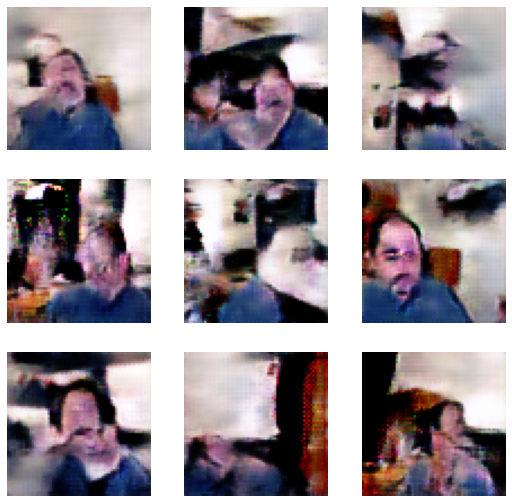

In [6]:
learn.show_results(max_n=9, ds_idx=0)

Still not great, but better than the last run. Going to try another round of training.

In [7]:
learn.fit(10)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.206180,0.167471,-0.283789,03:41
1,-0.175033,0.163798,-0.278594,03:40
2,-0.204212,0.161742,-0.281003,03:40
3,-0.194790,0.168169,-0.288154,03:40
4,-0.208613,0.172343,-0.279952,03:40
5,-0.183228,0.169289,-0.279075,03:40
6,-0.195093,0.167217,-0.271292,03:40
7,-0.197340,0.165893,-0.271587,03:39
8,-0.184512,0.164734,-0.269569,03:40
9,-0.185103,0.174702,-0.261279,03:41


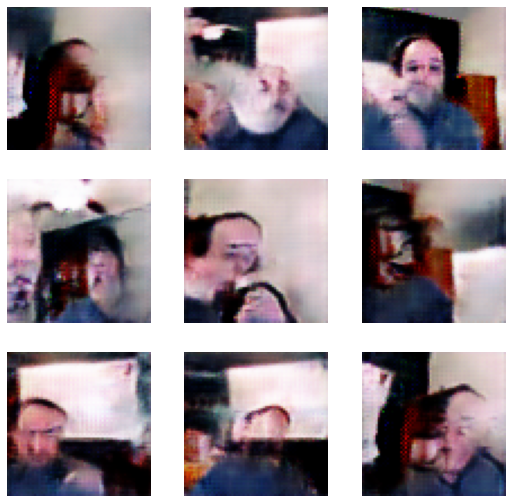

In [8]:
learn.show_results(max_n=9, ds_idx=0)

it's still getting better, and the various losses are still trending towards 0, so I'm going to keep going. One thing to note: in the Bedrooms demo GAN, it worked well with `gen_loss` around 0.03 . So, I think the plan is to keep training until the losses get down into the single digits or loss stops getting better.

If it stops getting better, then we conclued that it's learned as much as possible, and we're done. If it gets into the single digit percentage, I would *hope* that it starts to look realistic in its output.

In [9]:
learn.fit(10)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.169997,0.171244,-0.250847,03:43
1,-0.157317,0.168596,-0.237386,03:41
2,-0.154227,0.154297,-0.226197,03:41
3,-0.144735,0.142037,-0.215181,03:41
4,-0.139946,0.130003,-0.198296,03:40
5,-0.134794,0.108085,-0.183124,03:40
6,-0.117748,0.126481,-0.187136,03:39
7,-0.104950,0.113965,-0.171090,03:38
8,-0.178492,0.123321,-0.177626,03:40
9,-0.249526,0.222722,-0.323054,03:38


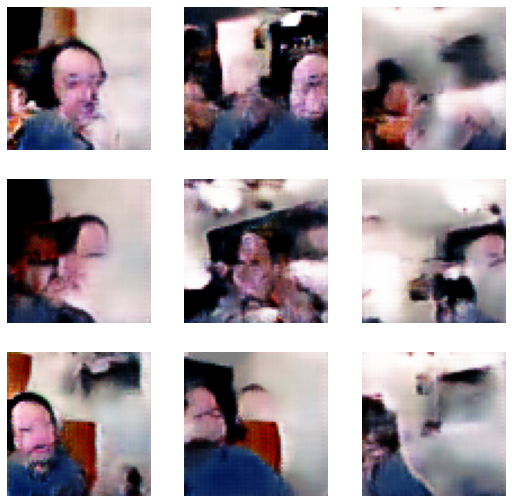

In [10]:
learn.show_results(max_n=9, ds_idx=0)

Well, this danced close to the loss I was looking for, but veered away at the last epoch. I'm not sure if it's overtrained at this point, or hit a local minimum. It's entirely possible that this is done, but let's try one...last...round

In [11]:
learn.fit(10)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.231483,0.223956,-0.327083,03:41
1,-0.218332,0.216949,-0.311624,03:40
2,-0.206123,0.209432,-0.300473,03:39
3,-0.203570,0.193394,-0.282236,03:40
4,-0.206031,0.170357,-0.282950,03:39
5,-0.186977,0.170541,-0.279931,03:40
6,-0.166500,0.154906,-0.257466,03:40
7,-0.167816,0.145489,-0.246759,03:40
8,-0.165711,0.141415,-0.232285,03:40
9,-0.179623,0.126671,-0.227564,03:40


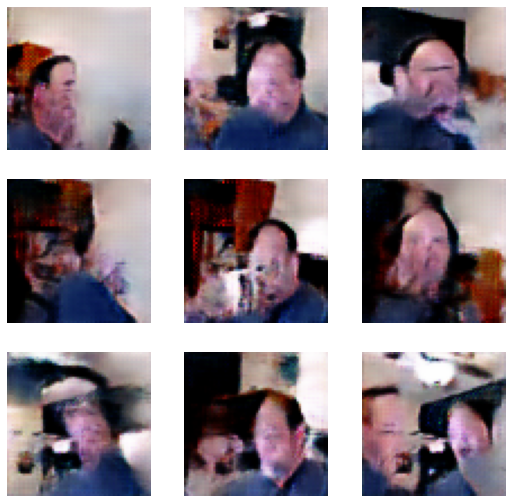

In [12]:
learn.show_results(max_n=9, ds_idx=0)

Hmmm...it's getting better about the backgrounds, but the faces are still a mess. Loss is still trending to 0, so I'm going to keep going. Given this, it's entirely possible that the "everything" GAN I tried earlier may have worked fine if I'd just kept going with more training epochs. Will try that later.

I'm seeing some examples in discussion boards that trained for literally thousands of epochs. Yeesh.

In [13]:
learn.fit(10)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.174093,0.129921,-0.233474,03:41
1,-0.158007,0.136265,-0.229554,03:40
2,-0.149425,0.136409,-0.209791,03:41
3,-0.141074,0.116028,-0.190886,03:41
4,-0.136684,0.117205,-0.194062,03:41
5,-0.124711,0.126089,-0.189822,03:41
6,-0.120115,0.119210,-0.187262,03:41
7,-0.167407,0.125902,-0.208625,03:40
8,-0.217424,0.183965,-0.279432,03:40
9,-0.199237,0.196330,-0.293670,03:41


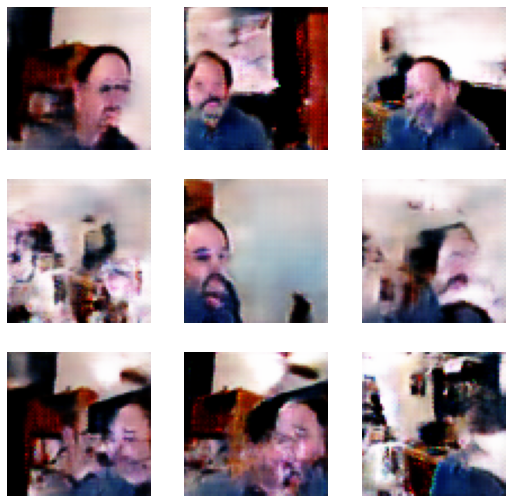

In [14]:
learn.show_results(max_n=9, ds_idx=0)

huh. It seems like it's getting better (this round of things have some facial features, even if they're in the wrong place). As I was just reading, apparently training for absurd #'s of epochs (like 4,000) is not unheard of, so I'm going to keep plugging away on epochs of training here.

In [15]:
learn.fit(30)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.207359,0.189549,-0.276540,03:42
1,-0.186583,0.196405,-0.272967,03:40
2,-0.161885,0.167560,-0.253771,03:41
3,-0.166532,0.152215,-0.241083,03:40
4,-0.179880,0.134748,-0.235183,03:41
5,-0.179341,0.137818,-0.258137,03:40
6,-0.164327,0.122301,-0.238167,03:41
7,-0.170888,0.119291,-0.227746,03:40
8,-0.172415,0.131701,-0.229303,03:38
9,-0.162101,0.115244,-0.215236,03:38


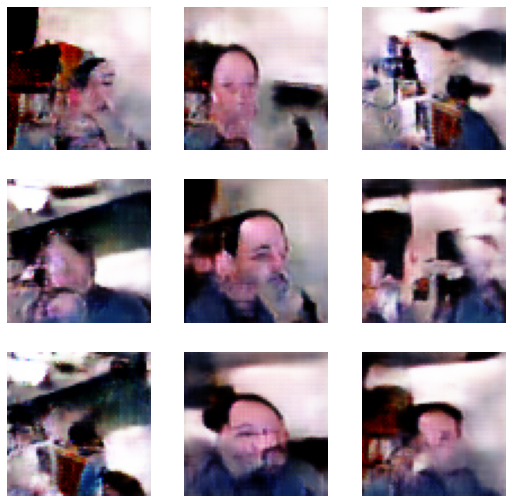

In [16]:
learn.show_results(max_n=9, ds_idx=0)

In [17]:
learn.fit(30)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.126002,0.138013,-0.211518,03:42
1,-0.149299,0.116268,-0.206548,03:41
2,-0.144432,0.113482,-0.199922,03:41
3,-0.144508,0.113528,-0.192821,03:42
4,-0.140134,0.114195,-0.195365,03:41
5,-0.157432,0.109353,-0.191447,03:43
6,-0.160572,0.117248,-0.212909,03:44
7,-0.161880,0.131651,-0.221946,03:42
8,-0.149932,0.124106,-0.216756,03:41
9,-0.134079,0.130474,-0.206335,03:41


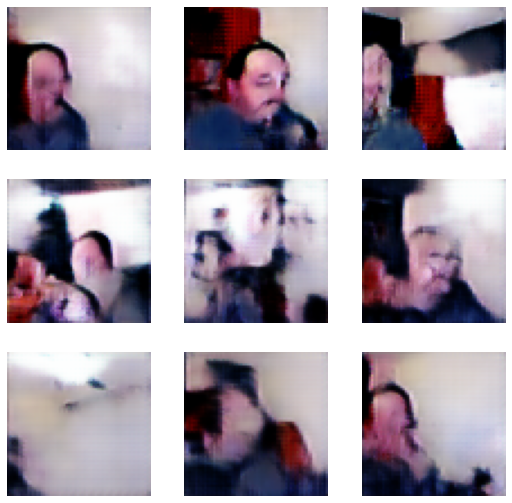

In [18]:
learn.show_results(max_n=9, ds_idx=0)

In [19]:
learn.save("all_office_120_epochs")

Path('/home/g-clef/local_ml_data_copy/narcissism_combos/all_office/models/all_office_120_epochs.pth')

Loss is super low, and the images are starting to get better. Not sure if it's possible to get loss any lower than it is right now. Will try, to see if I can make recognizable faces.

In [22]:
learn = learn.load("all_office_120_epochs")

In [23]:
learn.fit(2)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.001539,0.004539,-0.001533,03:43
1,-0.001250,-0.001027,-0.001322,03:42


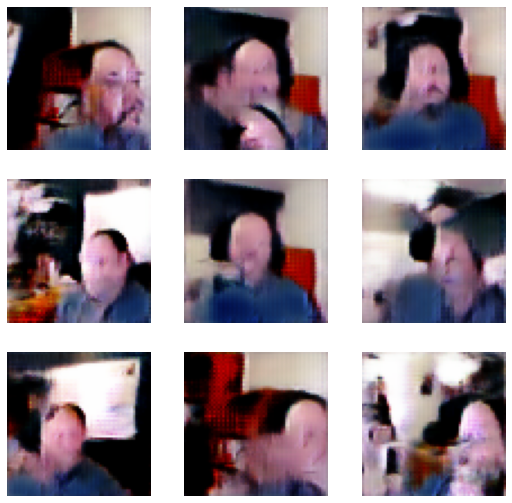

In [24]:
learn.show_results(max_n=9, ds_idx=0)

Loss is super-low, but the images are still not exactly recognizable as me. They're *close*. But it's still not right. Given this I'm going to try one last thing, which is to re-do this with just the images from one point of view, and let it train for a *long* time (which I think was my mistake earlier). I'm concerned that my taking the videos from multiple viewpoints is only making the problem harder for the learner. 

So, let's save our work here (in case I want to come back to this for some reason), and start over _yet_ _again_.

In [25]:
learn.save("all_office_122_epochs")

Path('/home/g-clef/local_ml_data_copy/narcissism_combos/all_office/models/all_office_122_epochs.pth')

In [3]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/4/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [4]:
learn.fit(100)

/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (generator) that exists in the learner. Use `self.learn.generator` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (critic) that exists in the learner. Use `self.learn.critic` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (gen_mode) that exists in the learner. Use `self.learn.gen_mode` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")


epoch,train_loss,gen_loss,crit_loss,time
0,-0.354714,0.237935,-0.401444,04:53
1,-0.465938,0.357195,-0.606292,00:45
2,-0.486950,0.369644,-0.678849,00:45
3,-0.493925,0.401288,-0.708260,00:45
4,-0.493556,0.373319,-0.669998,00:45
5,-0.450173,0.383162,-0.670246,00:45
6,-0.478280,0.380036,-0.683995,00:45
7,-0.495093,0.366930,-0.670121,00:45
8,-0.467589,0.382376,-0.659513,00:45
9,-0.453852,0.387180,-0.644101,00:45


/home/g-clef/anaconda3/lib/python3.8/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


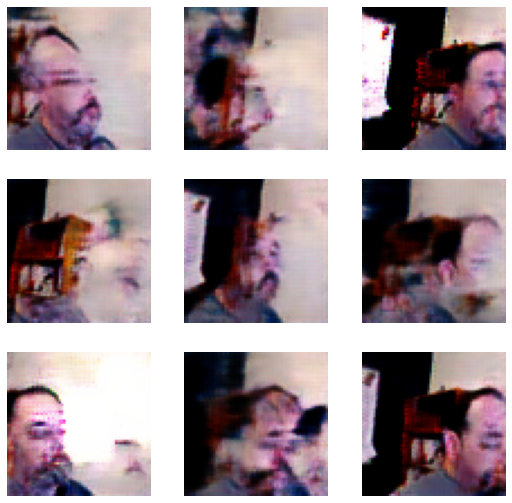

In [5]:
learn.show_results(max_n=9, ds_idx=0)

Huh. This appears to have started overfitting somewhere around epoch 60. That may be a side effect of this data set being much smaller than the combined one. The results are...interesting. They're in some ways better than the multi-viewpoint one, since this is drawing faces, even if the overall images are janky.

I should retry this and train for only 60-ish epochs to see if the results are better when it doesn't overfit.

In [6]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/4/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [7]:
learn.fit(60)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.340263,0.160515,-0.306702,00:46
1,-0.409047,0.275168,-0.547220,00:46
2,-0.617542,0.461045,-0.802755,00:46
3,-0.555854,0.515536,-0.831099,00:46
4,-0.537062,0.465120,-0.763967,00:46
5,-0.502313,0.471623,-0.758593,00:46
6,-0.521686,0.489890,-0.768980,00:45
7,-0.508176,0.448737,-0.714980,00:46
8,-0.479110,0.463546,-0.705247,00:45
9,-0.512087,0.444386,-0.706212,00:46


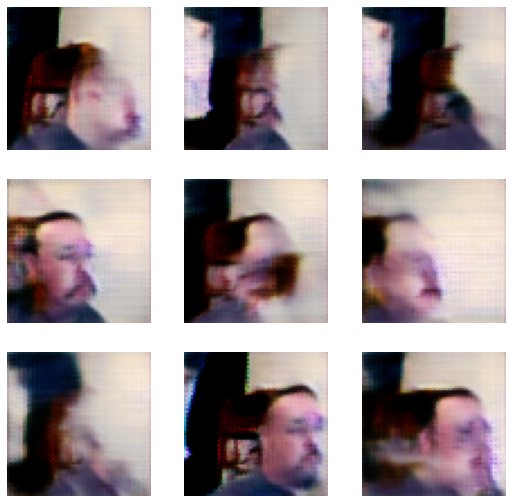

In [8]:
learn.show_results(max_n=9, ds_idx=0)

better, but still not at the level I'd like. It's clearly better than the starting point, and this is better than the overtrained one, but it's still not *good*. Given the amount of data I have, I may have to make do with this. 

What I've learned from this is that I probably could get better if I did the 3-hour video from one perspective, but I'm not convinced it's worth it at the moment. I don't plan to do much with GANs in the long run, so I don't want to spend a ton of time here. Let's save this model, though, since it's the best I've achieved so far.

In [9]:
learn.save("office_4_60_epochs")

Path('/home/g-clef/local_ml_data_copy/narcissism/4/models/office_4_60_epochs.pth')

Turbo pointed out that I'm not using  any data augmentation here, which could help immensely in making more data out of the smaller datasets I have. Let's try adding the fastai kitchen sink augmentations at this.

What this will do is make synthetic images by warping, resizing, cropping, adding noise, etc, to the images before including them in a batch that's given to the library. In effect, this can hugely increase the effective # of images in your set, since an image that's flipped is a totally new image from the point of view of the learner.

In [18]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/4/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    tfms = aug_transforms(xtra_tfms=Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = tfms)
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [19]:
learn.fit(60)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.313631,0.205064,-0.479725,00:47
1,-0.256550,0.042549,-0.303908,00:47
2,-0.282058,0.098409,-0.329466,00:47
3,-0.286965,0.109930,-0.370728,00:47
4,-0.279576,0.073687,-0.366645,00:48
5,-0.286009,0.128764,-0.382208,00:47
6,-0.366527,0.243303,-0.468151,00:47
7,-0.379595,0.225871,-0.506418,00:47
8,-0.403663,0.241615,-0.528699,00:47
9,-0.400019,0.222429,-0.505824,00:47


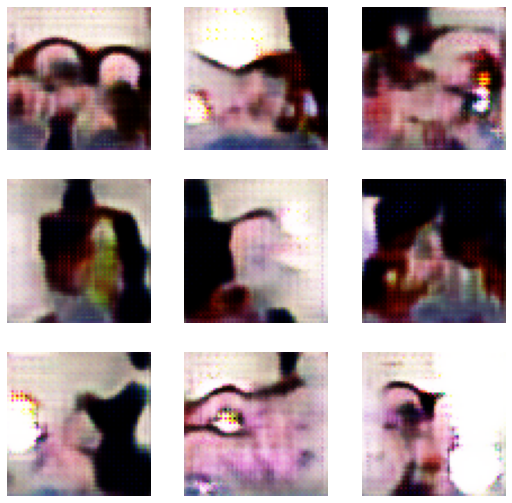

In [20]:
learn.show_results(max_n=9, ds_idx=0)

Interesting that this seems to have overtrained much earlier (45-ish epochs), and the results are *terrible*. I think a big part of this is the `warp` data augmenter. The images all look like they've been warped in some way, which is making the results be *really* wrong. 

Going to try two things: turning off "warp" of images, and only train for 45 epochs

In [21]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/4/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    tfms = aug_transforms(max_warp=0.0, xtra_tfms=Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = tfms)
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [22]:
learn.fit(45)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.237881,0.152247,-0.348173,00:47
1,-0.267914,0.164373,-0.293188,00:47
2,-0.370069,0.174660,-0.453993,00:47
3,-0.375719,0.151831,-0.488826,00:47
4,-0.374562,0.197355,-0.462287,00:47
5,-0.435677,0.206790,-0.523497,00:47
6,-0.477659,0.286669,-0.619500,00:47
7,-0.446875,0.288952,-0.622307,00:46
8,-0.461084,0.331265,-0.642453,00:46
9,-0.478326,0.320253,-0.650555,00:47


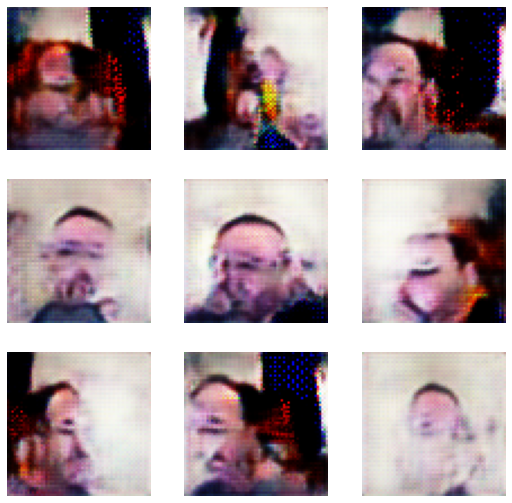

In [23]:
learn.show_results(max_n=9, ds_idx=0)

In [24]:
learn.fit(20)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.231203,0.169647,-0.336462,00:46
1,-0.238082,0.194233,-0.331390,00:47
2,-0.233076,0.189165,-0.326662,00:47
3,-0.236316,0.188704,-0.329301,00:46
4,-0.245866,0.182289,-0.320658,00:47
5,-0.225953,0.208616,-0.325992,00:46
6,-0.219273,0.197946,-0.326305,00:46
7,-0.229412,0.169577,-0.317202,00:47
8,-0.228763,0.184106,-0.319156,00:47
9,-0.225814,0.164720,-0.298268,00:47


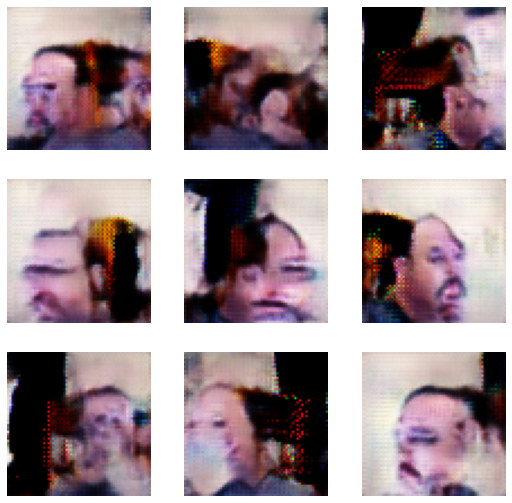

In [25]:
learn.show_results(max_n=9, ds_idx=0)

In [26]:
learn.fit(20)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.192573,0.110289,-0.252958,00:47
1,-0.160794,0.158270,-0.250311,00:47
2,-0.201418,0.074272,-0.248348,00:47
3,-0.162790,0.100482,-0.234073,00:47
4,-0.074419,-0.048505,-0.136042,00:46
5,-0.074397,-0.097206,-0.077664,00:47
6,-0.076130,-0.132690,-0.075386,00:47
7,-0.087923,-0.149644,-0.058680,00:46
8,-0.084372,-0.172950,-0.085736,00:46
9,-0.011122,-0.005847,-0.039801,00:46


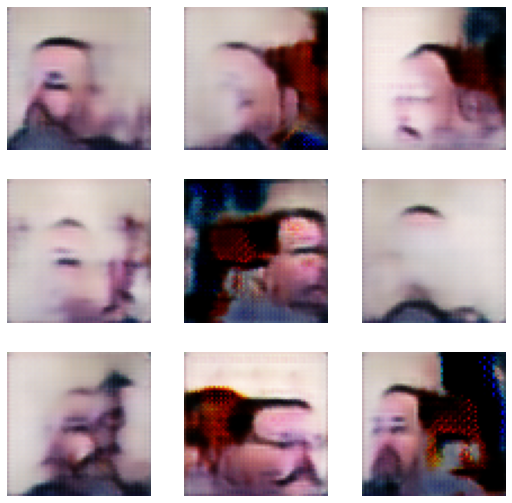

In [27]:
learn.show_results(max_n=9, ds_idx=0)

In [28]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/4/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    tfms = aug_transforms(mult=0.0, xtra_tfms=Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = tfms)
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [29]:
learn.fit(65)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.315627,0.118678,-0.400478,00:47
1,-0.305086,0.047515,-0.371656,00:46
2,-0.294229,0.112204,-0.422827,00:46
3,-0.334691,0.091902,-0.430130,00:46
4,-0.336351,0.062203,-0.412321,00:47
5,-0.360910,0.157113,-0.455326,00:46
6,-0.396583,0.188986,-0.482239,00:46
7,-0.452492,0.296892,-0.610334,00:46
8,-0.462846,0.298396,-0.604574,00:46
9,-0.505026,0.296066,-0.655059,00:46


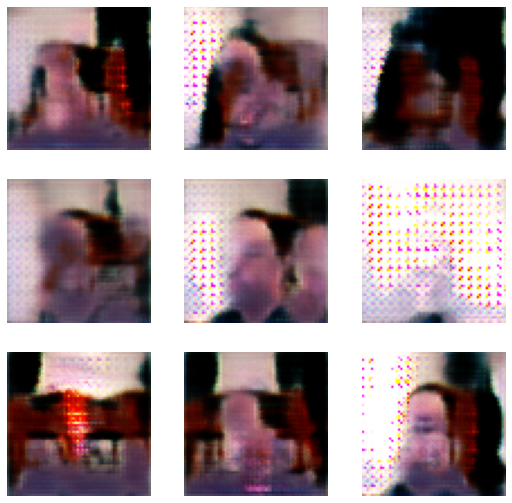

In [30]:
learn.show_results(max_n=9, ds_idx=0)

Well, this just looks *bad*. Throwing the kitchen sink at it, even after turning off warp, rotate, and lighting changes, seems to have made it much worse. 

Perhaps the deep end wasn't the right way to go. Let's try this with fewer augmentations, like just one or two. 

In [32]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/4/")
dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]))
def get_dls(bs, size):
    tfms = setup_aug_tfms([Flip(), Zoom(), Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5]))])
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = tfms)
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [33]:
learn.fit(60)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.241035,0.126154,-0.304361,00:47
1,-0.371458,0.122670,-0.412678,00:46
2,-0.367280,0.150378,-0.469269,00:46
3,-0.389375,0.190836,-0.507048,00:46
4,-0.474718,0.228023,-0.571981,00:46
5,-0.475894,0.264008,-0.631912,00:46
6,-0.491994,0.300087,-0.670736,00:46
7,-0.522115,0.350261,-0.690685,00:47
8,-0.478935,0.333405,-0.674658,00:46
9,-0.493479,0.352898,-0.689126,00:46


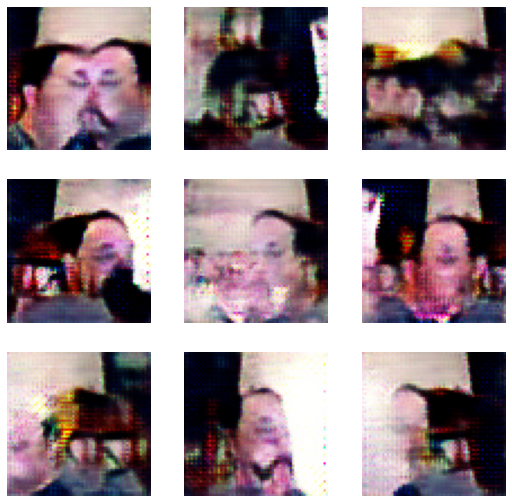

In [34]:
learn.show_results(max_n=9, ds_idx=0)

Interesting. So even flipping the image may be a mistake. I"m not sure about zoom.

Things to research:
 1. What are the exact meanings of the various loss functions? in other words, if the generator and critic are constantly trying to fool each other, and training until they do, there's clearly a different loss function used for the user-displayed loss than the generator/critic loss. And, what does "train_loss" mean in this context?
 2. How to do other things with this GAN, once trained. Data reclaimation/regeneration, face swapping, etc.
 3. What are the actual models underneath both the generator and the critic? 

Coming back to this after a bit. I'm concerned that the complexity of the background made it hard for the GAN to focus on the right things, so I re-recorded myself for an hour with a sheet behind me, to minimize the background data. I suspect the folds in the sheet will still cause some confusion, but hopefully less than the bookshelf/wall/whiteboard combo. Going to give this one last try with the sheet video, which also has 100k images, in the hope that brute force image volume plus a simpler background will make the GAN work better. Also, no augmentation, since I think that's just confusing the situation.

In [2]:
path = Path("/home/g-clef/local_ml_data_copy/narcissism/sheets/")
def get_dls(bs, size):
    dblock = DataBlock(blocks = (TransformBlock, ImageBlock),
                   get_x = generate_noise,
                   get_items = get_image_files,
                   splitter = IndexSplitter([]),
                   item_tfms=Resize(size, method=ResizeMethod.Crop), 
                   batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
    return dblock.dataloaders(path, path=path, bs=bs)
dls = get_dls(128, 64)
generator = basic_generator(64, n_channels=3, n_extra_layers=1)
critic    = basic_critic   (64, n_channels=3, n_extra_layers=1, act_cls=partial(nn.LeakyReLU, negative_slope=0.2))
learn = GANLearner.wgan(dls, generator, critic, opt_func = RMSProp)
learn.recorder.train_metrics=True
learn.recorder.valid_metrics=False

In [6]:
learn.fit(40)

epoch,train_loss,gen_loss,crit_loss,time
0,-0.224708,0.091782,-0.311547,01:52
1,-0.467462,0.201060,-0.437703,01:52
2,-0.394794,0.240108,-0.529864,01:53
3,-0.352297,0.226826,-0.466221,01:53
4,-0.329552,0.263715,-0.467264,01:52
5,-0.367645,0.281560,-0.503013,01:52
6,-0.374325,0.288055,-0.494125,01:52
7,-0.354582,0.290853,-0.482419,01:52
8,-0.341903,0.316175,-0.459142,01:52
9,-0.280942,0.285583,-0.419537,01:52


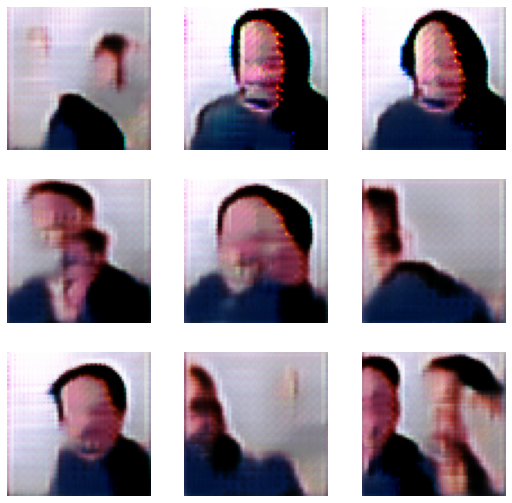

In [7]:
learn.show_results(max_n=9, ds_idx=0)

Interesting. I think there is promise here. I'm a little concerned with the duplication and the fact that it never got a face in any of them, especially since the loss rates are so low, but I think this is worth at least a push farther into training. Let's see what happens if we do another 100 epochs. 

epoch,train_loss,gen_loss,crit_loss,time
0,-0.000310,0.025132,-0.013283,01:53
1,-0.012842,0.013140,-0.012156,01:53
2,-0.275530,0.215484,-0.155505,01:54
3,-0.321152,0.341147,-0.458143,01:53
4,-0.330388,0.359198,-0.459652,01:53
5,-0.297182,0.330434,-0.433998,01:53
6,-0.272060,0.313266,-0.413568,01:53
7,-0.294746,0.308767,-0.405343,01:53
8,-0.257013,0.306693,-0.379570,01:53
9,-0.264071,0.306771,-0.370433,01:53


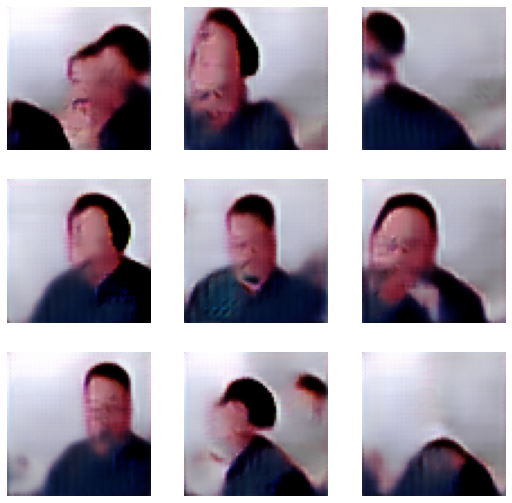

In [8]:
learn.fit(100)
learn.show_results(max_n=9, ds_idx=0)

well, that bites.

In [9]:
learn.save("sheets")

Path('/home/g-clef/local_ml_data_copy/narcissism/sheets/models/sheets.pth')

In [4]:
learn = learn.load("sheets")

In [5]:
learn.fit(100)

/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (generator) that exists in the learner. Use `self.learn.generator` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (critic) that exists in the learner. Use `self.learn.critic` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (gen_mode) that exists in the learner. Use `self.learn.gen_mode` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")


epoch,train_loss,gen_loss,crit_loss,time
0,-0.003198,0.014975,-0.002344,12:20
1,-0.137660,0.055482,-0.086613,02:42
2,-0.190935,0.208971,-0.247565,01:53
3,-0.176632,0.200732,-0.257458,01:51
4,-0.167166,0.184528,-0.244163,01:52
5,-0.161942,0.188839,-0.242184,01:52
6,-0.147873,0.190333,-0.218780,01:51
7,-0.168228,0.231787,-0.249808,01:51
8,-0.184574,0.224226,-0.250368,01:51
9,-0.184178,0.213230,-0.261832,01:51


/home/g-clef/anaconda3/lib/python3.8/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


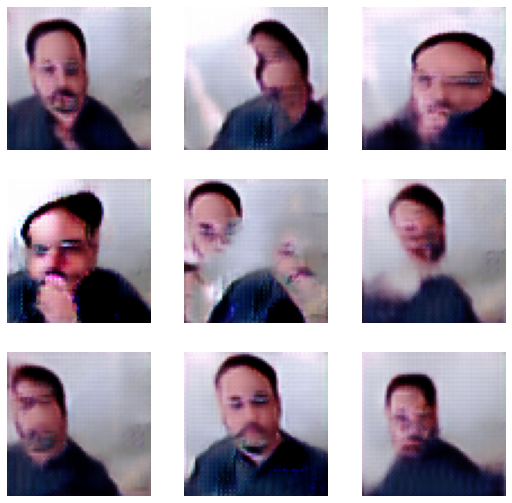

In [6]:
learn.show_results(max_n=9, ds_idx=0)

getting much better. Interesting.

epoch,train_loss,gen_loss,crit_loss,time
0,-0.187858,0.062491,-0.254767,01:51
1,-0.182440,0.039809,-0.238428,01:51
2,-0.151884,0.017902,-0.211501,01:51
3,-0.172565,0.016930,-0.206190,01:51
4,-0.179217,0.034531,-0.221471,01:51
5,-0.159079,0.033228,-0.209766,01:52
6,-0.131413,0.033414,-0.168491,01:51
7,-0.104348,0.066020,-0.159766,01:51
8,-0.042215,0.043865,-0.110941,01:52
9,-0.031287,-0.102308,-0.037167,01:51


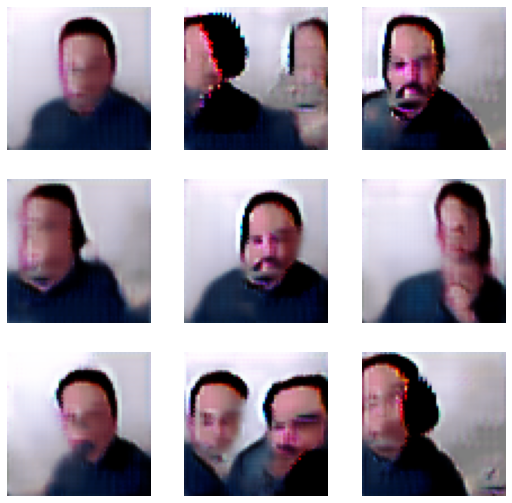

In [7]:
learn.fit(100)
learn.show_results(max_n=9, ds_idx=0)

In [8]:
learn.save("sheets_300")

Path('/home/g-clef/local_ml_data_copy/narcissism/sheets/models/sheets_300.pth')

In [3]:
learn = learn.load("sheets_300")

In [ ]:
learn.fit(100)
learn.show_results(max_n=9, ds_idx=0)

/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (generator) that exists in the learner. Use `self.learn.generator` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (critic) that exists in the learner. Use `self.learn.critic` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/g-clef/anaconda3/lib/python3.8/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (gen_mode) that exists in the learner. Use `self.learn.gen_mode` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")


epoch,train_loss,gen_loss,crit_loss,time
0,-0.007900,-0.013480,-0.012751,12:45


/home/g-clef/anaconda3/lib/python3.8/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
